In [27]:
import numpy as np
import pandas as pd
import pgeocode
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

In [67]:
df= pd.read_csv('preprocessed_2017.csv')

In [68]:
df.head()

,zip_code,Population Density (Per Sq. Mile),incomeBelowPovertyLevelProportion,incomePerCapita,incomeGiniIndex,underPoverty,popDensity,whiteMajority,eduHsOrLessProportion,eduHsProportion,...,employedProportion,employedPvtSecProportion,employedPubSecProportion,employedSelfEmpProportion,employedPvtNonProProportion,employedUnpaidFamProportion,insuredProportion,housingRentMoreThan30pcProportion,longitude,latitude
0,10001,38537.590,0.152420,86014.0,0.6074,0,38537.590,0.623168,0.061326,0.236168,...,0.938119,0.698973,0.060862,0.134652,0.104186,0.001328,0.942582,0.435837,NaN,NaN
1,10002,88610.210,0.263844,30677.0,0.5725,1,88610.210,0.314431,0.332338,0.336358,...,0.917144,0.705079,0.094036,0.111864,0.082307,0.006715,0.928928,0.492107,NaN,NaN
2,10003,95471.940,0.091452,91141.0,0.5680,0,95471.940,0.779159,0.035003,0.161239,...,0.951225,0.707649,0.061125,0.130766,0.098642,0.001818,0.955539,0.424384,NaN,NaN
3,10004,5341.677,0.025443,105390.0,0.4436,0,5341.677,0.688963,0.014114,0.080946,...,0.963320,0.731556,0.058544,0.126606,0.083294,0.000000,0.934783,0.368374,NaN,NaN
4,10005,118063.100,0.117209,102957.0,0.4588,0,118063.100,0.748157,0.007028,0.108231,...,0.973356,0.831641,0.032671,0.069757,0.065931,0.000000,0.956777,0.370124,NaN,NaN


In [69]:
df = df.set_index('zip_code')

In [70]:
df.drop(['longitude','latitude'],axis=1, inplace=True)

In [71]:
df.head()

,Population Density (Per Sq. Mile),incomeBelowPovertyLevelProportion,incomePerCapita,incomeGiniIndex,underPoverty,popDensity,whiteMajority,eduHsOrLessProportion,eduHsProportion,eduBachOrBetterProportion,eduEnrollmentProportion,eduDropoutProportion,employedProportion,employedPvtSecProportion,employedPubSecProportion,employedSelfEmpProportion,employedPvtNonProProportion,employedUnpaidFamProportion,insuredProportion,housingRentMoreThan30pcProportion
zip_code,,,,,,,,,,,,,,,,,,,,
10001,38537.590,0.152420,86014.0,0.6074,0,38537.590,0.623168,0.061326,0.236168,0.702506,0.220734,0.013311,0.938119,0.698973,0.060862,0.134652,0.104186,0.001328,0.942582,0.435837
10002,88610.210,0.263844,30677.0,0.5725,1,88610.210,0.314431,0.332338,0.336358,0.331304,0.179846,0.042967,0.917144,0.705079,0.094036,0.111864,0.082307,0.006715,0.928928,0.492107
10003,95471.940,0.091452,91141.0,0.5680,0,95471.940,0.779159,0.035003,0.161239,0.803757,0.272403,0.004515,0.951225,0.707649,0.061125,0.130766,0.098642,0.001818,0.955539,0.424384
10004,5341.677,0.025443,105390.0,0.4436,0,5341.677,0.688963,0.014114,0.080946,0.904940,0.147580,0.000000,0.963320,0.731556,0.058544,0.126606,0.083294,0.000000,0.934783,0.368374
10005,118063.100,0.117209,102957.0,0.4588,0,118063.100,0.748157,0.007028,0.108231,0.884742,0.187189,0.000000,0.973356,0.831641,0.032671,0.069757,0.065931,0.000000,0.956777,0.370124


In [72]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3195 entries, 10001 to 19979
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Population Density (Per Sq. Mile)  3195 non-null   float64
 1   incomeBelowPovertyLevelProportion  3195 non-null   float64
 2   incomePerCapita                    3195 non-null   float64
 3   incomeGiniIndex                    3195 non-null   float64
 4   underPoverty                       3195 non-null   int64  
 5   popDensity                         3195 non-null   float64
 6   whiteMajority                      3195 non-null   float64
 7   eduHsOrLessProportion              3195 non-null   float64
 8   eduHsProportion                    3195 non-null   float64
 9   eduBachOrBetterProportion          3195 non-null   float64
 10  eduEnrollmentProportion            3195 non-null   float64
 11  eduDropoutProportion               3195 non-null   

In [73]:
df.isnull().sum()

Population Density (Per Sq. Mile)    0
incomeBelowPovertyLevelProportion    0
incomePerCapita                      0
incomeGiniIndex                      0
underPoverty                         0
popDensity                           0
whiteMajority                        0
eduHsOrLessProportion                0
eduHsProportion                      0
eduBachOrBetterProportion            0
eduEnrollmentProportion              0
eduDropoutProportion                 0
employedProportion                   0
employedPvtSecProportion             0
employedPubSecProportion             0
employedSelfEmpProportion            0
employedPvtNonProProportion          0
employedUnpaidFamProportion          0
insuredProportion                    0
housingRentMoreThan30pcProportion    0
dtype: int64

In [74]:
df.duplicated().sum()

0

In [75]:
df.describe()

,Population Density (Per Sq. Mile),incomeBelowPovertyLevelProportion,incomePerCapita,incomeGiniIndex,underPoverty,popDensity,whiteMajority,eduHsOrLessProportion,eduHsProportion,eduBachOrBetterProportion,eduEnrollmentProportion,eduDropoutProportion,employedProportion,employedPvtSecProportion,employedPubSecProportion,employedSelfEmpProportion,employedPvtNonProProportion,employedUnpaidFamProportion,insuredProportion,housingRentMoreThan30pcProportion
count,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000,3195.000000
mean,3729.964397,0.111019,31538.392175,0.414522,0.073865,3729.964397,0.874376,0.107984,0.628453,0.263563,0.225910,0.050852,0.936606,0.652074,0.145944,0.097268,0.102639,0.002075,0.928698,0.401302
std,13075.664685,0.075400,14233.068292,0.062046,0.261593,13075.664685,0.184752,0.069064,0.142011,0.162535,0.072239,0.109699,0.039534,0.105963,0.075609,0.059339,0.054328,0.006333,0.056533,0.187986
min,0.789848,0.000000,2621.000000,0.047700,0.000000,0.789848,0.021461,0.000000,0.076923,0.000000,0.000000,0.000000,0.595556,0.000000,0.000000,0.000000,0.000000,0.000000,0.366816,0.000000
25%,64.719000,0.060607,23958.500000,0.378350,0.000000,64.719000,0.857713,0.061314,0.559990,0.149068,0.189171,0.000000,0.921488,0.596621,0.095090,0.061276,0.071062,0.000000,0.913629,0.297374
50%,235.917200,0.095992,27936.000000,0.411800,0.000000,235.917200,0.950467,0.095238,0.662879,0.218228,0.220945,0.007905,0.943638,0.664116,0.133971,0.086486,0.095808,0.000000,0.940071,0.411565
75%,1480.031000,0.141132,34815.000000,0.448200,0.000000,1480.031000,0.980575,0.136840,0.725610,0.335318,0.255036,0.054353,0.960703,0.719125,0.183130,0.121121,0.125638,0.001728,0.960741,0.508185
max,159438.900000,0.705882,153897.000000,0.696800,1.000000,159438.900000,1.000000,0.535537,0.981221,0.912821,0.997695,1.000000,1.000000,1.000000,0.629703,0.714286,0.821429,0.137778,1.000000,1.000000


## Univariate Analysis

In [76]:
def univariateAnalysis_numeric(column):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df[column].describe(),end=' ')
    
    
    plt.figure()
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    sns.distplot(df[column], kde=False, color='g');
    plt.show()
    

In [77]:
dfcolumns = list(df.columns.values)
dfcolumns = [col for col in df.columns]
dfcolumns

['Population Density (Per Sq. Mile)',
 'incomeBelowPovertyLevelProportion',
 'incomePerCapita',
 'incomeGiniIndex',
 'underPoverty',
 'popDensity',
 'whiteMajority',
 'eduHsOrLessProportion',
 'eduHsProportion',
 'eduBachOrBetterProportion',
 'eduEnrollmentProportion',
 'eduDropoutProportion',
 'employedProportion',
 'employedPvtSecProportion',
 'employedPubSecProportion',
 'employedSelfEmpProportion',
 'employedPvtNonProProportion',
 'employedUnpaidFamProportion',
 'insuredProportion',
 'housingRentMoreThan30pcProportion']

Description of Population Density (Per Sq. Mile)
----------------------------------------------------------------------------
count      3195.000000
mean       3729.964397
std       13075.664685
min           0.789848
25%          64.719000
50%         235.917200
75%        1480.031000
max      159438.900000
Name: Population Density (Per Sq. Mile), dtype: float64 Distribution of Population Density (Per Sq. Mile)
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


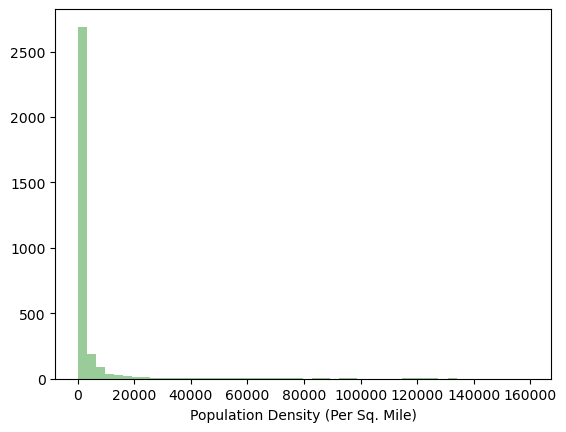

Description of incomeBelowPovertyLevelProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.111019
std         0.075400
min         0.000000
25%         0.060607
50%         0.095992
75%         0.141132
max         0.705882
Name: incomeBelowPovertyLevelProportion, dtype: float64 Distribution of incomeBelowPovertyLevelProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


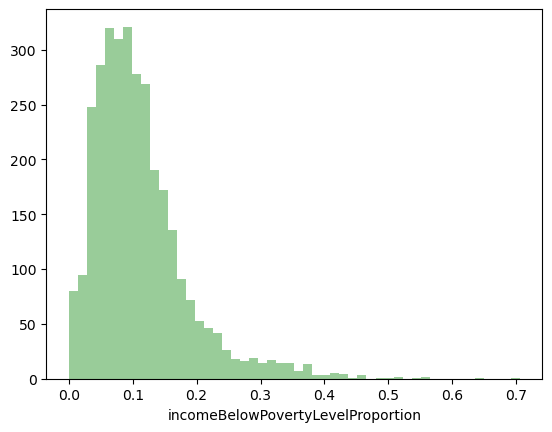

Description of incomePerCapita
----------------------------------------------------------------------------
count      3195.000000
mean      31538.392175
std       14233.068292
min        2621.000000
25%       23958.500000
50%       27936.000000
75%       34815.000000
max      153897.000000
Name: incomePerCapita, dtype: float64 Distribution of incomePerCapita
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


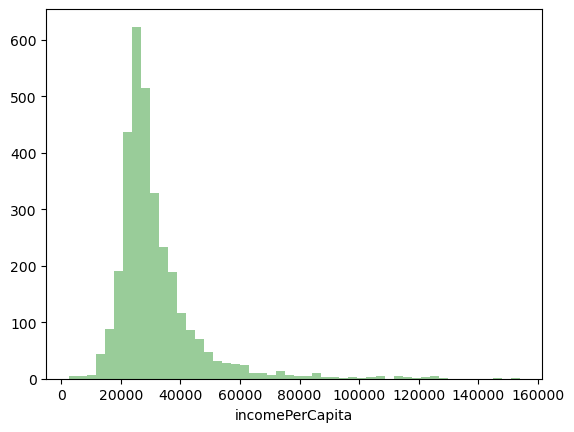

Description of incomeGiniIndex
----------------------------------------------------------------------------
count    3195.000000
mean        0.414522
std         0.062046
min         0.047700
25%         0.378350
50%         0.411800
75%         0.448200
max         0.696800
Name: incomeGiniIndex, dtype: float64 Distribution of incomeGiniIndex
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


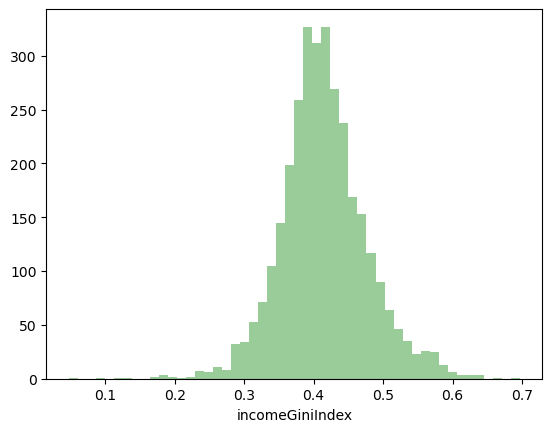

Description of underPoverty
----------------------------------------------------------------------------
count    3195.000000
mean        0.073865
std         0.261593
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: underPoverty, dtype: float64 Distribution of underPoverty
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


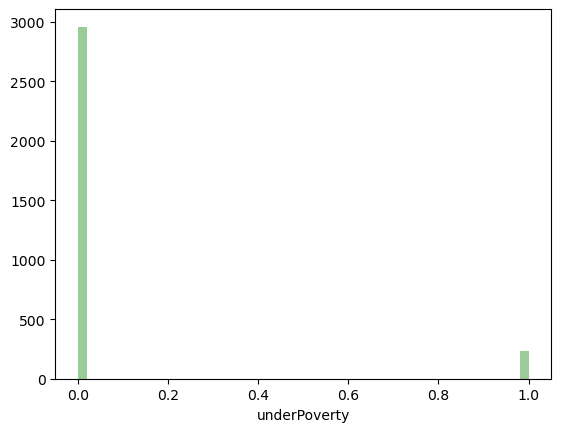

Description of popDensity
----------------------------------------------------------------------------
count      3195.000000
mean       3729.964397
std       13075.664685
min           0.789848
25%          64.719000
50%         235.917200
75%        1480.031000
max      159438.900000
Name: popDensity, dtype: float64 Distribution of popDensity
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


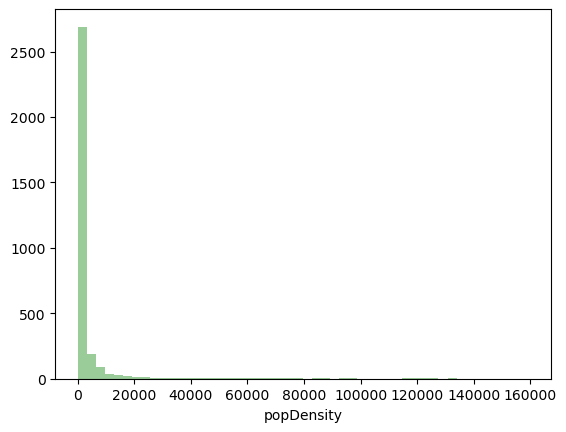

Description of whiteMajority
----------------------------------------------------------------------------
count    3195.000000
mean        0.874376
std         0.184752
min         0.021461
25%         0.857713
50%         0.950467
75%         0.980575
max         1.000000
Name: whiteMajority, dtype: float64 Distribution of whiteMajority
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


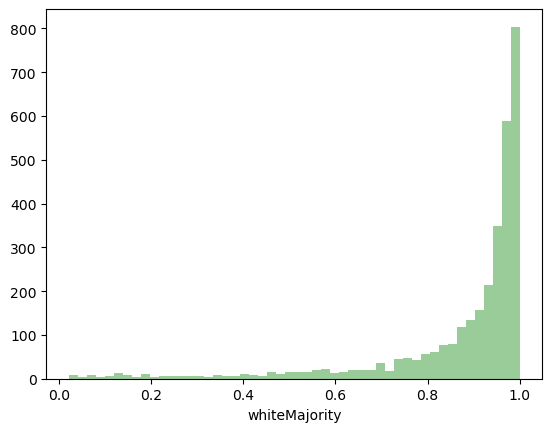

Description of eduHsOrLessProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.107984
std         0.069064
min         0.000000
25%         0.061314
50%         0.095238
75%         0.136840
max         0.535537
Name: eduHsOrLessProportion, dtype: float64 Distribution of eduHsOrLessProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


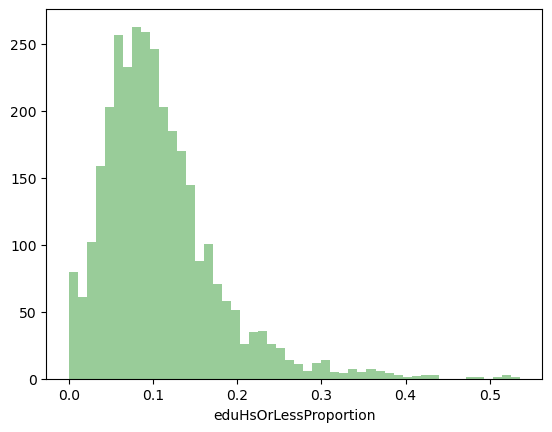

Description of eduHsProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.628453
std         0.142011
min         0.076923
25%         0.559990
50%         0.662879
75%         0.725610
max         0.981221
Name: eduHsProportion, dtype: float64 Distribution of eduHsProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


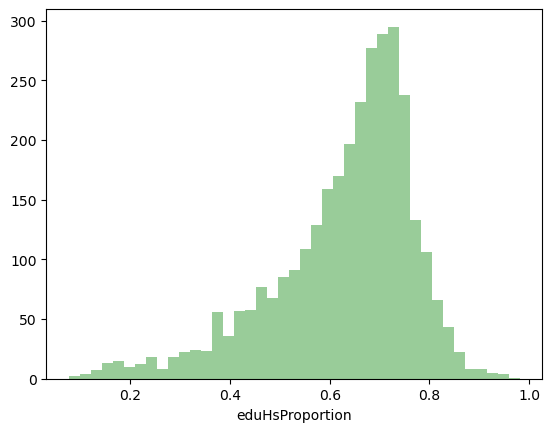

Description of eduBachOrBetterProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.263563
std         0.162535
min         0.000000
25%         0.149068
50%         0.218228
75%         0.335318
max         0.912821
Name: eduBachOrBetterProportion, dtype: float64 Distribution of eduBachOrBetterProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


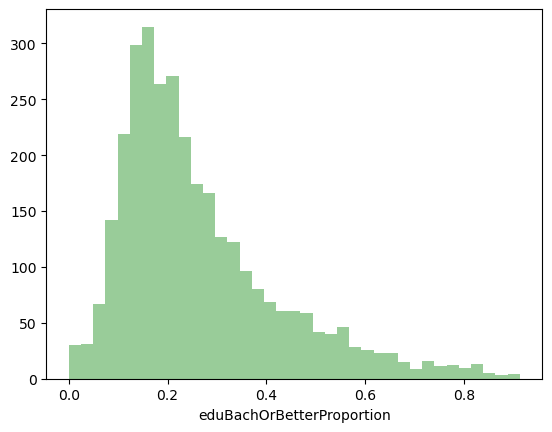

Description of eduEnrollmentProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.225910
std         0.072239
min         0.000000
25%         0.189171
50%         0.220945
75%         0.255036
max         0.997695
Name: eduEnrollmentProportion, dtype: float64 Distribution of eduEnrollmentProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


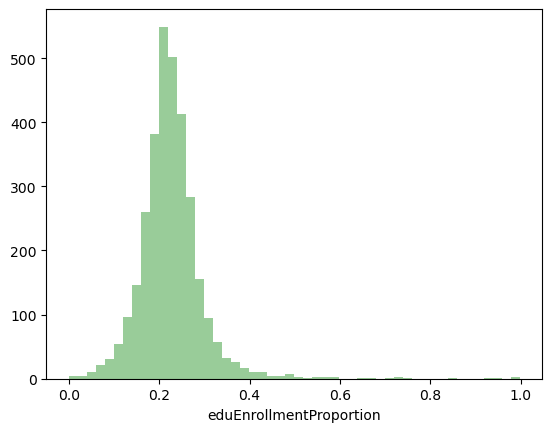

Description of eduDropoutProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.050852
std         0.109699
min         0.000000
25%         0.000000
50%         0.007905
75%         0.054353
max         1.000000
Name: eduDropoutProportion, dtype: float64 Distribution of eduDropoutProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


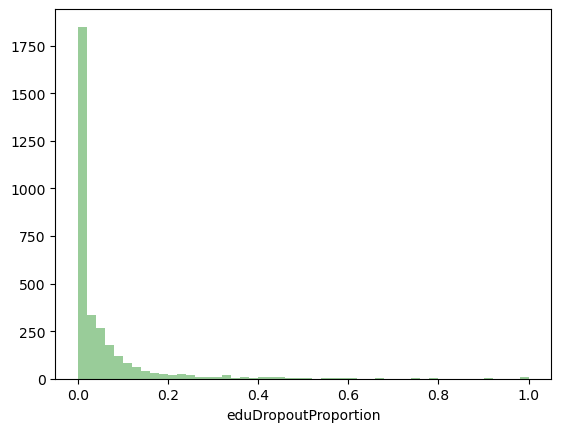

Description of employedProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.936606
std         0.039534
min         0.595556
25%         0.921488
50%         0.943638
75%         0.960703
max         1.000000
Name: employedProportion, dtype: float64 Distribution of employedProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


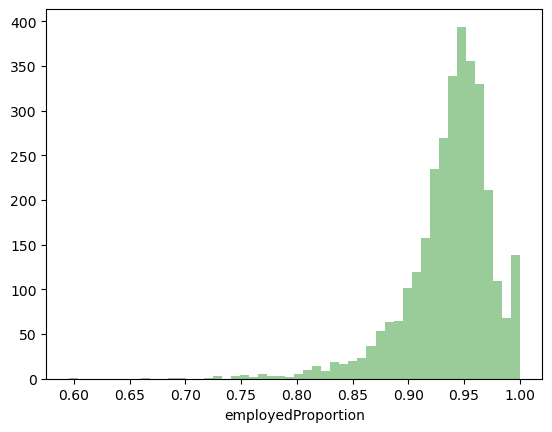

Description of employedPvtSecProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.652074
std         0.105963
min         0.000000
25%         0.596621
50%         0.664116
75%         0.719125
max         1.000000
Name: employedPvtSecProportion, dtype: float64 Distribution of employedPvtSecProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


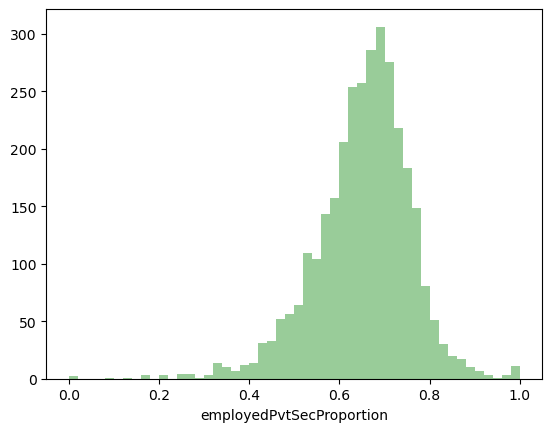

Description of employedPubSecProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.145944
std         0.075609
min         0.000000
25%         0.095090
50%         0.133971
75%         0.183130
max         0.629703
Name: employedPubSecProportion, dtype: float64 Distribution of employedPubSecProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


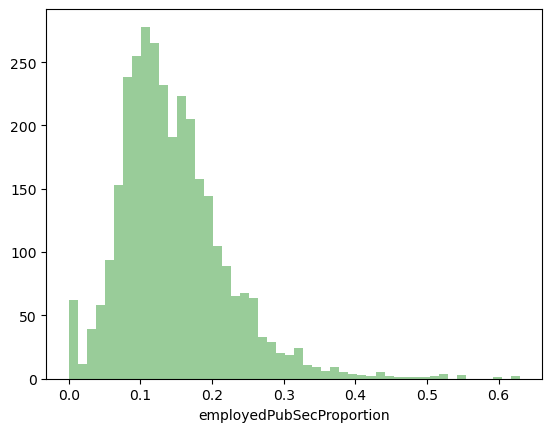

Description of employedSelfEmpProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.097268
std         0.059339
min         0.000000
25%         0.061276
50%         0.086486
75%         0.121121
max         0.714286
Name: employedSelfEmpProportion, dtype: float64 Distribution of employedSelfEmpProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


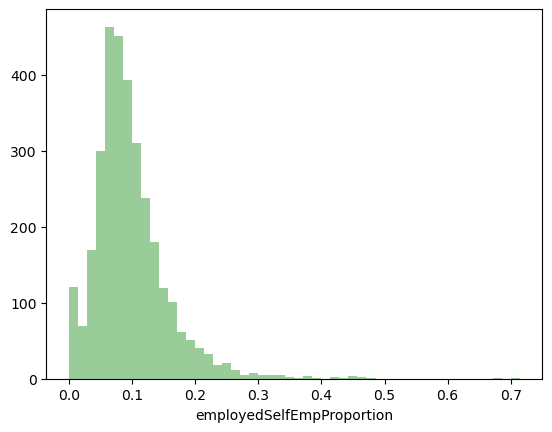

Description of employedPvtNonProProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.102639
std         0.054328
min         0.000000
25%         0.071062
50%         0.095808
75%         0.125638
max         0.821429
Name: employedPvtNonProProportion, dtype: float64 Distribution of employedPvtNonProProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


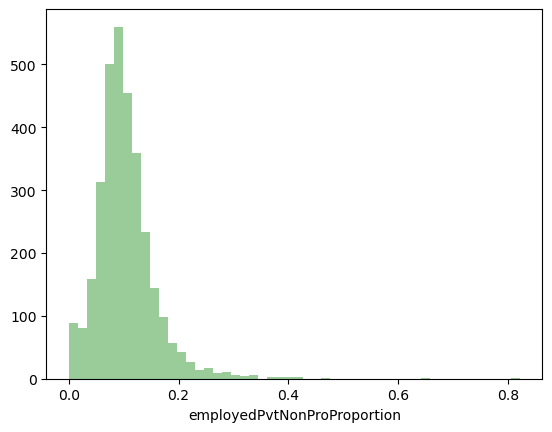

Description of employedUnpaidFamProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.002075
std         0.006333
min         0.000000
25%         0.000000
50%         0.000000
75%         0.001728
max         0.137778
Name: employedUnpaidFamProportion, dtype: float64 Distribution of employedUnpaidFamProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


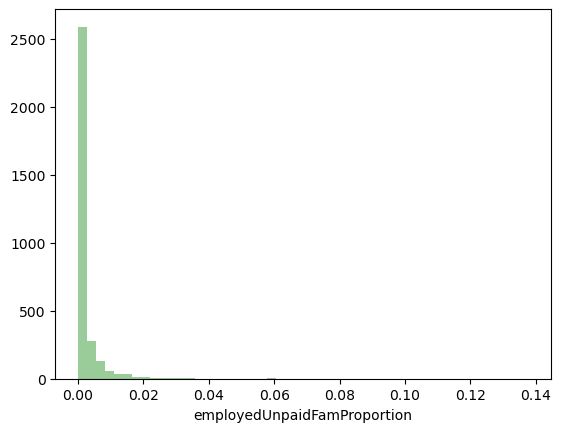

Description of insuredProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.928698
std         0.056533
min         0.366816
25%         0.913629
50%         0.940071
75%         0.960741
max         1.000000
Name: insuredProportion, dtype: float64 Distribution of insuredProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


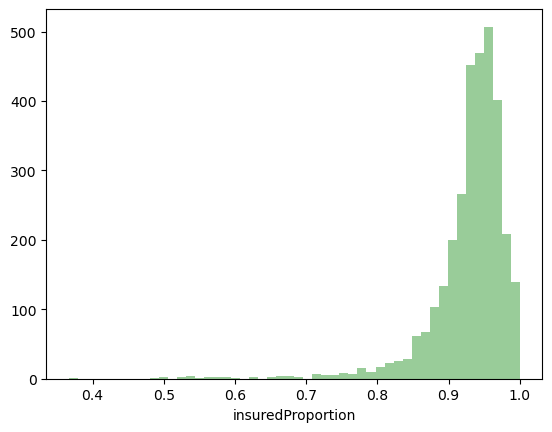

Description of housingRentMoreThan30pcProportion
----------------------------------------------------------------------------
count    3195.000000
mean        0.401302
std         0.187986
min         0.000000
25%         0.297374
50%         0.411565
75%         0.508185
max         1.000000
Name: housingRentMoreThan30pcProportion, dtype: float64 Distribution of housingRentMoreThan30pcProportion
----------------------------------------------------------------------------


C:\Users\ARU PC\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


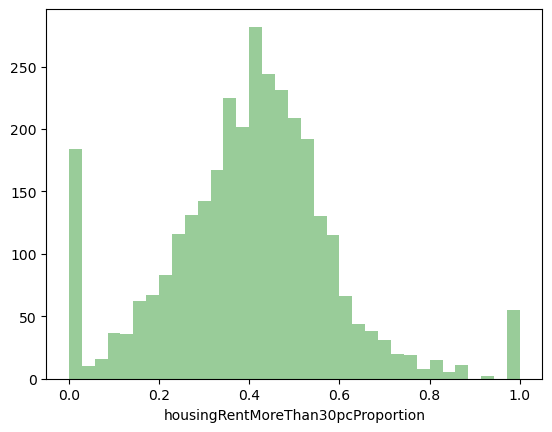

In [78]:
for x in dfcolumns:
    univariateAnalysis_numeric(x)

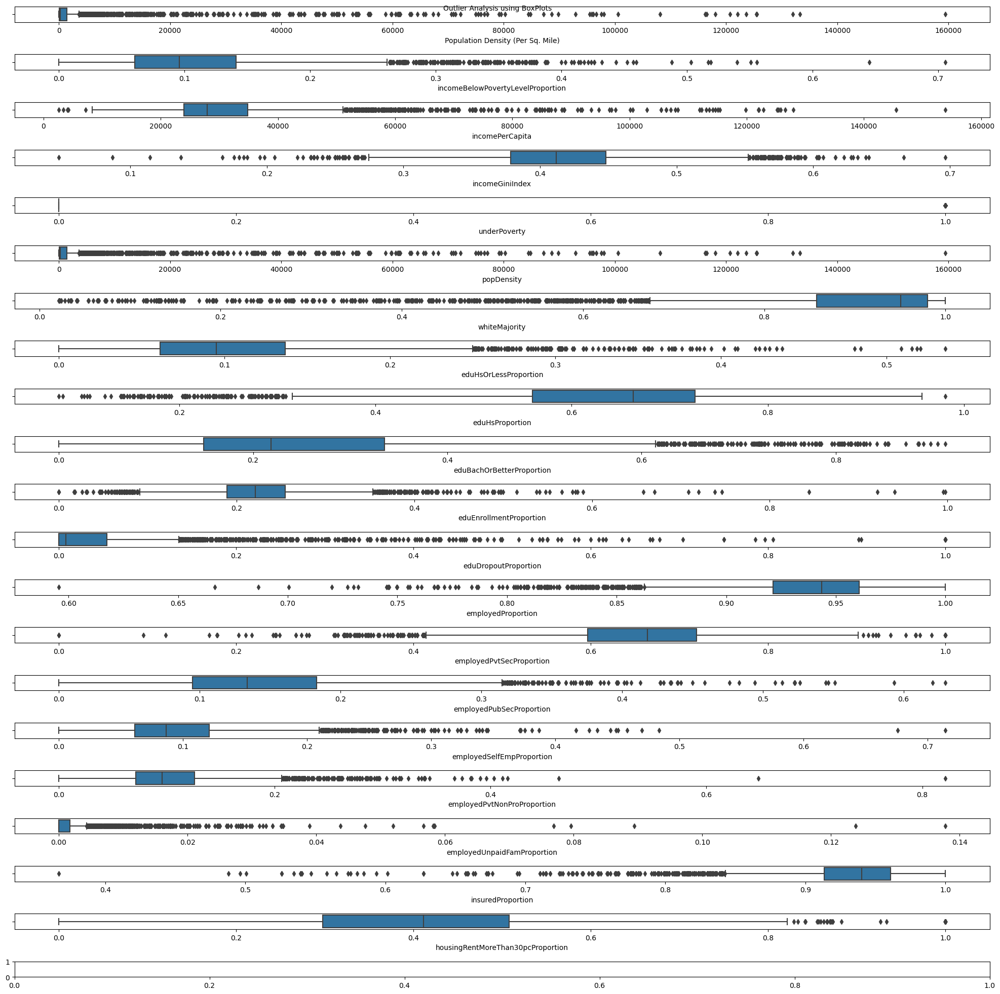

In [79]:
fig, ax = plt.subplots(21, figsize=(20, 20))
ax = ax.flatten()

for i, c in enumerate(df.columns):
    sns.boxplot(x=df.iloc[:, i], ax=ax[i])
    #ax[i].set_title(c)
    
plt.suptitle('Outlier Analysis using BoxPlots', fontsize=10)
fig.tight_layout()

In [80]:
df.skew(axis = 0).sort_values(ascending=False)

employedUnpaidFamProportion          9.574189
Population Density (Per Sq. Mile)    6.073444
popDensity                           6.073444
eduDropoutProportion                 4.518281
underPoverty                         3.260041
incomePerCapita                      3.049472
eduEnrollmentProportion              2.583359
employedPvtNonProProportion          2.267116
employedSelfEmpProportion            2.125938
incomeBelowPovertyLevelProportion    1.853719
eduHsOrLessProportion                1.615865
employedPubSecProportion             1.305539
eduBachOrBetterProportion            1.279693
housingRentMoreThan30pcProportion    0.169618
incomeGiniIndex                      0.059827
employedPvtSecProportion            -0.748721
eduHsProportion                     -1.068811
employedProportion                  -1.743860
whiteMajority                       -2.458710
insuredProportion                   -3.194990
dtype: float64

In [81]:
#pip install dataprep

  0%|                                                                                         | 0/4162 [00:00<…

DataPrep Report
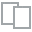
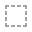
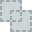
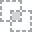
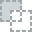
...
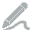
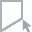
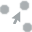
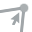
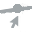

In [82]:
# from dataprep.eda import create_report

# create_report(df)

In [83]:
import matplotlib.pyplot as plt
%matplotlib inline

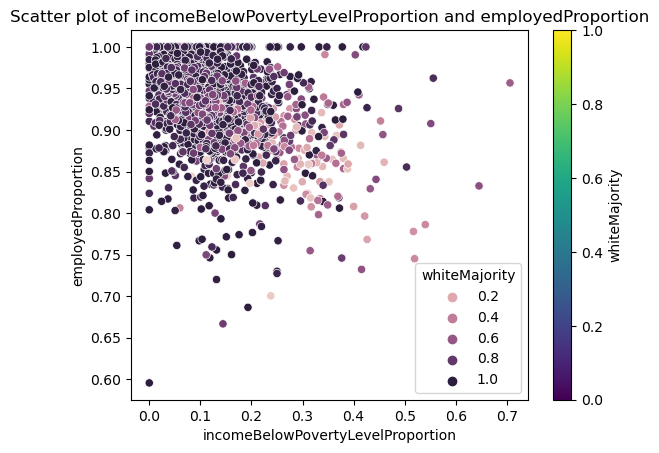

In [84]:
# Create a figure and axes object
fig, ax = plt.subplots()

# Create a scatter plot with a color-mapped variable
scatter_plot = sns.scatterplot(x='incomeBelowPovertyLevelProportion', y="employedProportion", hue="whiteMajority", data=df, ax=ax)

# Add a colorbar for the plot
colorbar = fig.colorbar(scatter_plot.get_children()[0], ax=ax)
colorbar.set_label('whiteMajority')

# Add plot labels and title
plt.xlabel('incomeBelowPovertyLevelProportion')
plt.ylabel('employedProportion')
plt.title('Scatter plot of incomeBelowPovertyLevelProportion and employedProportion')

# Show the plot
plt.show()

In [85]:
import plotly.graph_objs as go
import pandas as pd
import pgeocode
import ipywidgets as widgets
from ipywidgets import interact

In [89]:
# Create dropdown widgets for x axis variable and color scale
x_var_dropdown = widgets.Dropdown(options=list(df.columns[4:]), description='Variable')
colorscale_dropdown = widgets.Dropdown(options=['Viridis', 'Cividis', 'Plasma'], description='Color Scale')

# Define function to create the scatter plot
def scatterplot(x_var, colorscale):
    fig = go.Figure(data=go.Scattergeo(
        lon = pgeocode.Nominatim('us').query_postal_code(df.index.tolist()).longitude,
        lat = pgeocode.Nominatim('us').query_postal_code(df.index.tolist()).latitude,
        marker = dict(
            size = 10,
            color = df[x_var],
            colorscale = colorscale,
            cmax = df[x_var].max(),
            cmin = df[x_var].min(),
            colorbar=dict(
                title=x_var
            )
        )
    ))
    fig.update_layout(
        title = f'{x_var} for zip codes',
        geo_scope='usa',
    )
    fig.show()

In [90]:
# Create interactive plot using the scatterplot function and the dropdown widgets
interactive_plot = interact(scatterplot, 
                            x_var=x_var_dropdown,
                            colorscale=colorscale_dropdown)

# Display the interactive plot
interactive_plot

interactive(children=(Dropdown(description='Variable', options=('underPoverty', 'popDensity', 'whiteMajority',…

<function __main__.scatterplot(x_var, colorscale)>